# Import Libraries

In [5]:
import os
from pathlib import Path
import shutil

import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report,
    recall_score,
    f1_score,
    precision_score,
    accuracy_score,
    ConfusionMatrixDisplay
)
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

import pickle


# Data Loading

In [6]:
# Takes the path to a directory & generates batches of augmented data from a directory

IMG_SIZE = 400
path = '/Users/david/Graded Challenge/phase 2/p2-ftds018-hck-g7-new-utomon/fire_dataset'

datagen = tf.keras.preprocessing.image.ImageDataGenerator()
data = datagen.flow_from_directory(path, (IMG_SIZE, IMG_SIZE), batch_size=32, class_mode='binary', shuffle=False)

Found 999 images belonging to 2 classes.


In [7]:
# Show data type of variable `data`

data

In [8]:
# Show images in pixel form

print('Images : ', data[0][0])
print('Shape  : ', data[0][0].shape)

Images :  [[[[204. 208. 207.]
   [203. 207. 206.]
   [203. 207. 206.]
   ...
   [169. 166. 151.]
   [169. 166. 151.]
   [170. 167. 152.]]

  [[205. 209. 208.]
   [205. 209. 208.]
   [205. 209. 208.]
   ...
   [168. 165. 150.]
   [168. 165. 150.]
   [168. 165. 150.]]

  [[206. 210. 209.]
   [207. 211. 210.]
   [206. 210. 209.]
   ...
   [168. 165. 150.]
   [169. 163. 149.]
   [169. 163. 149.]]

  ...

  [[ 56.  46.  34.]
   [ 68.  55.  38.]
   [ 86.  68.  48.]
   ...
   [105.  93.  67.]
   [109.  92.  48.]
   [ 92.  73.  41.]]

  [[ 65.  55.  45.]
   [ 63.  49.  36.]
   [ 82.  63.  46.]
   ...
   [ 86.  71.  48.]
   [ 75.  60.  19.]
   [ 65.  48.  20.]]

  [[ 66.  55.  49.]
   [ 29.  15.   4.]
   [ 80.  61.  47.]
   ...
   [ 69.  52.  34.]
   [ 76.  62.  36.]
   [ 69.  53.  40.]]]


 [[[121. 116. 120.]
   [112. 110. 113.]
   [120. 118. 119.]
   ...
   [122. 126. 127.]
   [101. 106. 109.]
   [ 86.  91.  94.]]

  [[112. 110. 113.]
   [ 93.  91.  94.]
   [108. 106. 107.]
   ...
   [107. 11

In [9]:
# Show classes

print('Class  : ', data[0][1])
print('Shape  : ', data[0][1].shape)

Class  :  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
Shape  :  (32,)


In [10]:
# Show pixel of first image

print('Pixel : \n', data[0][0][0])
print('Shape : ', data[0][0][0].shape)

Pixel : 
 [[[204. 208. 207.]
  [203. 207. 206.]
  [203. 207. 206.]
  ...
  [169. 166. 151.]
  [169. 166. 151.]
  [170. 167. 152.]]

 [[205. 209. 208.]
  [205. 209. 208.]
  [205. 209. 208.]
  ...
  [168. 165. 150.]
  [168. 165. 150.]
  [168. 165. 150.]]

 [[206. 210. 209.]
  [207. 211. 210.]
  [206. 210. 209.]
  ...
  [168. 165. 150.]
  [169. 163. 149.]
  [169. 163. 149.]]

 ...

 [[ 56.  46.  34.]
  [ 68.  55.  38.]
  [ 86.  68.  48.]
  ...
  [105.  93.  67.]
  [109.  92.  48.]
  [ 92.  73.  41.]]

 [[ 65.  55.  45.]
  [ 63.  49.  36.]
  [ 82.  63.  46.]
  ...
  [ 86.  71.  48.]
  [ 75.  60.  19.]
  [ 65.  48.  20.]]

 [[ 66.  55.  49.]
  [ 29.  15.   4.]
  [ 80.  61.  47.]
  ...
  [ 69.  52.  34.]
  [ 76.  62.  36.]
  [ 69.  53.  40.]]]
Shape :  (400, 400, 3)


In [47]:
# Index of category

class_names = data.class_indices
print(class_names)

{'fire_images': 0, 'non_fire_images': 1}


# EDA

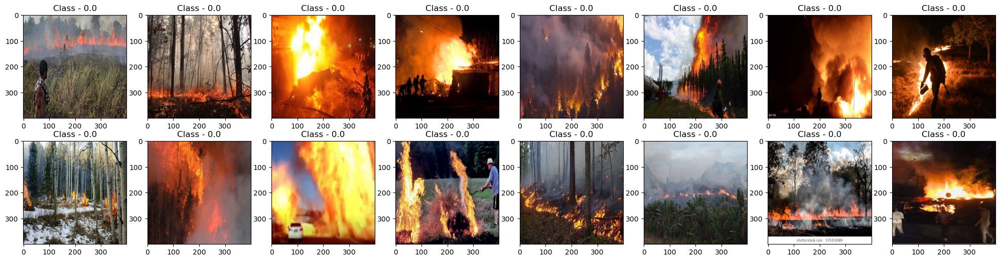

In [12]:
# Show each of image from both categories

fig, ax = plt.subplots(nrows=2, ncols=8, figsize=(25,6))
n = 0

for i in range(2):
  for j in range(8):
    img = data[0][0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title('Class - ' + str(data[0][1][n]))
    n += 1

In [13]:
# Example of how to split dataset into train-set and validation-set using `flow_from_directory`

imgen = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=0.4)

train = imgen.flow_from_directory(path,
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',
                                  shuffle=True,
                                  seed=2)
val = imgen.flow_from_directory(path,
                                target_size=(400,400),
                                class_mode='binary',
                                subset='validation',
                                shuffle=True,
                                seed=2)

Found 600 images belonging to 2 classes.
Found 399 images belonging to 2 classes.


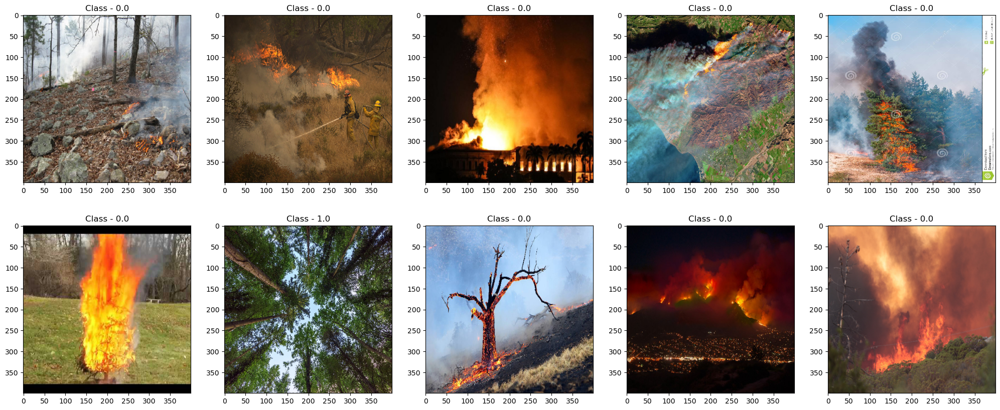

In [14]:
# Show images of train-set

fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25,10))
n = 0

for i in range(2):
  for j in range(5):
    img = train[0][0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title('Class - ' + str(train[0][1][n]))
    n += 1

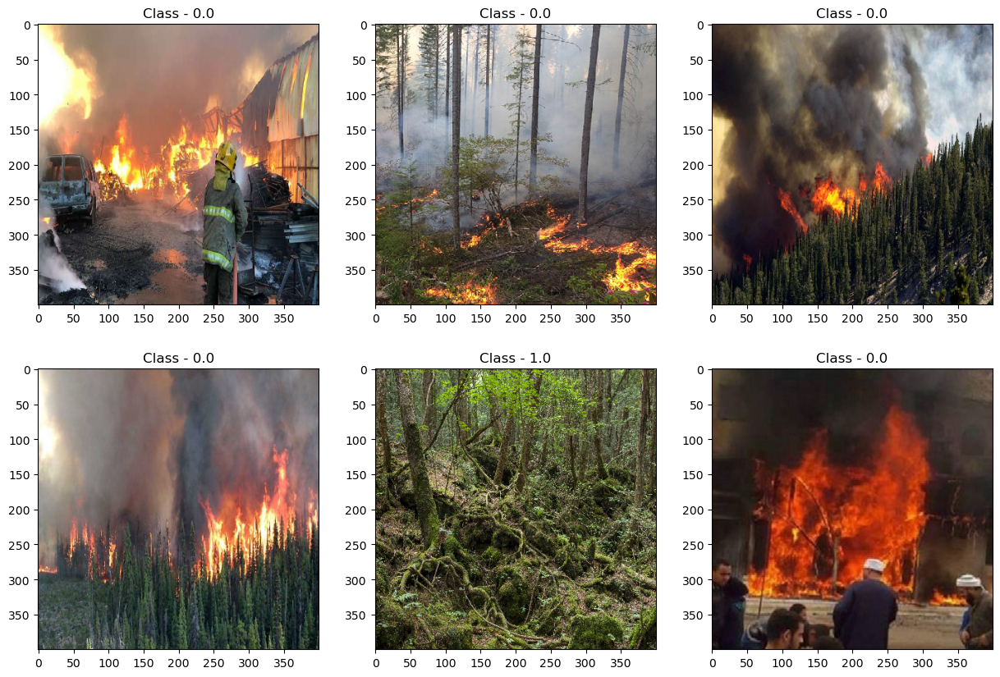

In [15]:
# Show images of val-set

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(15,10))
n = 0

for i in range(2):
  for j in range(3):
    img = val[0][0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title('Class - ' + str(val[0][1][n]))
    n += 1

In [49]:
def visualize_class_distribution(generator, title):
    class_indices = generator.class_indices
    classes = list(class_indices.keys())

    class_counts = np.zeros(len(classes))
    for label in generator.classes:
        class_counts[label] += 1

    plt.figure(figsize=(10, 5))
    sns.barplot(x=classes, y=class_counts)
    plt.title(title)
    plt.xlabel('Class')
    plt.ylabel('Number of images')
    plt.show()

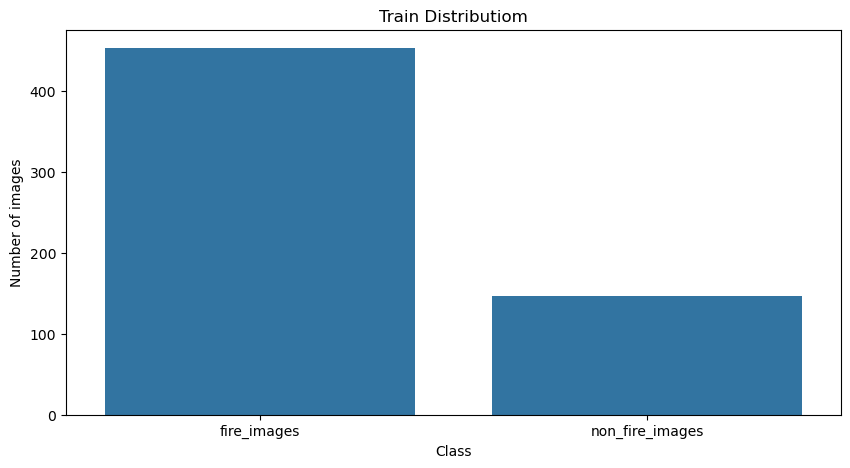

In [52]:
visualize_class_distribution(train, 'Train Distributiom')

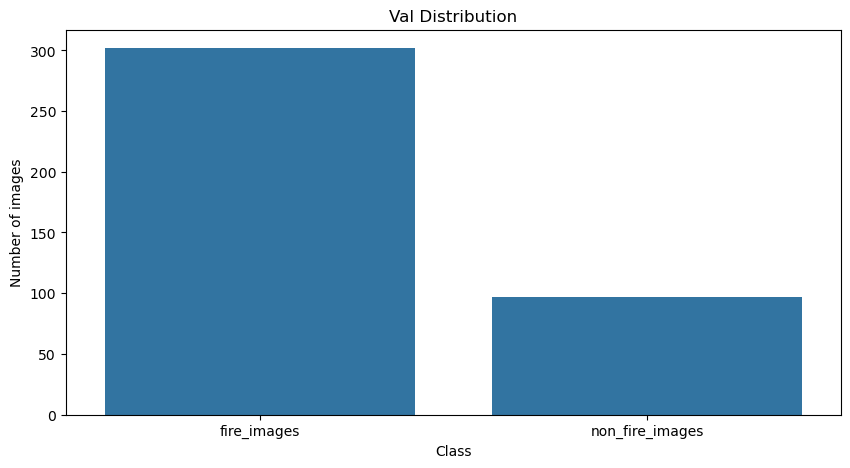

In [53]:
visualize_class_distribution(val, 'Val Distribution')

# Data Augmentation

## Combining Together

Found 600 images belonging to 2 classes.
Found 399 images belonging to 2 classes.


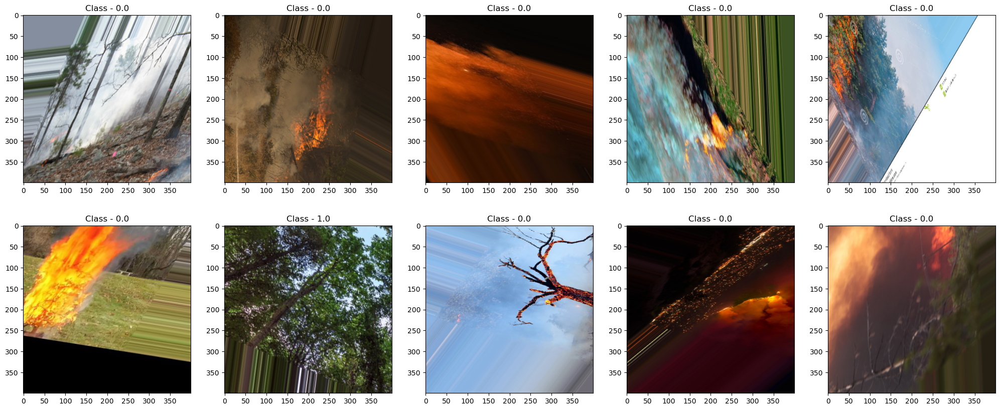

In [23]:
# Data Augmentation - Combine all previous data augmentations
imgen3 = tf.keras.preprocessing.image.ImageDataGenerator(width_shift_range=[-100, 100],
                                                         height_shift_range=[-100, 100],
                                                         rotation_range=120,
                                                         zoom_range = [0.3, 1.5],
                                                         shear_range=50,
                                                         validation_split=0.4)
train3 = imgen3.flow_from_directory(path,
                                    target_size=(400,400),
                                    class_mode='binary',
                                    subset='training',
                                    shuffle=True,
                                    seed=2)
val3 = imgen3.flow_from_directory(path,
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='validation',
                                  shuffle=True,
                                  seed=2)

# Show images of train-set
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25,10))
n = 0

for i in range(2):
  for j in range(5):
    img = train3[0][0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title('Class - ' + str(train[0][1][n]))
    n += 1

# ANN Training

## Modeling Definition

In [29]:
model1 = tf.keras.models.Sequential()

model1.add(tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(400, 400, 3)))
model1.add(tf.keras.layers.MaxPooling2D(2, 2))
model1.add(tf.keras.layers.Conv2D(64, (3,3), activation='relu'))
model1.add(tf.keras.layers.MaxPooling2D(2, 2))
model1.add(tf.keras.layers.Conv2D(128, (3,3), activation='relu'))
model1.add(tf.keras.layers.MaxPooling2D(2, 2))
model1.add(tf.keras.layers.Flatten())
model1.add(tf.keras.layers.Dropout(0.5))
model1.add(tf.keras.layers.Dense(512, activation='relu'))
model1.add(tf.keras.layers.Dense(1, activation='sigmoid'))  # Output layer for binary classification

# Compile the model1
model1.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Display the model1 summary
model1.summary()

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 398, 398, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 199, 199, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 197, 197, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 98, 98, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 96, 96, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 48, 48, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 294912)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 294912)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │   150,995,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 151,089,217 (576.36 MB)

 Trainable params: 151,089,217 (576.36 MB)

 Non-trainable params: 0 (0.00 B)

We use relu here in order to avoid the vanishing gradient problem and enhances computational efficiency while reducing the likelihood of overfitting. In addition, we added dropout to further reduce overfitting and prevent the model from relying too heavily on any single neuron.

## Model Training

In [30]:
history1 = model1.fit(train3, epochs=25, steps_per_epoch=20, validation_data = val3, verbose = 1, validation_steps=10)

Epoch 1/25
19/20 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.6170 - loss: 829.2696

/opt/anaconda3/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


20/20 ━━━━━━━━━━━━━━━━━━━━ 70s 3s/step - accuracy: 0.6215 - loss: 807.3627 - val_accuracy: 0.9125 - val_loss: 0.9360
Epoch 2/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 59s 3s/step - accuracy: 0.8865 - loss: 0.5854 - val_accuracy: 0.9367 - val_loss: 0.1860
Epoch 3/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 70s 3s/step - accuracy: 0.9151 - loss: 0.1922 - val_accuracy: 0.8469 - val_loss: 0.3621
Epoch 4/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 60s 3s/step - accuracy: 0.8952 - loss: 0.3052 - val_accuracy: 0.9241 - val_loss: 0.4290
Epoch 5/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 67s 3s/step - accuracy: 0.9109 - loss: 0.2562 - val_accuracy: 0.8125 - val_loss: 0.4554
Epoch 6/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.8996 - loss: 0.2752 - val_accuracy: 0.9114 - val_loss: 0.2562
Epoch 7/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 66s 3s/step - accuracy: 0.9211 - loss: 0.2125 - val_accuracy: 0.8281 - val_loss: 0.3289
Epoch 8/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 63s 3s/step - accuracy: 0.8911 - loss: 0.2625 - val_accuracy: 0.9241 - val_loss: 0.1693
E

2024-08-12 17:34:00.503603: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


20/20 ━━━━━━━━━━━━━━━━━━━━ 69s 3s/step - accuracy: 0.8967 - loss: 0.2538 - val_accuracy: 0.8844 - val_loss: 0.2630
Epoch 20/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 62s 3s/step - accuracy: 0.8885 - loss: 0.2626 - val_accuracy: 0.9114 - val_loss: 0.2689
Epoch 21/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 70s 3s/step - accuracy: 0.8963 - loss: 0.2794 - val_accuracy: 0.8594 - val_loss: 0.3499
Epoch 22/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 62s 3s/step - accuracy: 0.8945 - loss: 0.2195 - val_accuracy: 0.8861 - val_loss: 0.2291
Epoch 23/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 64s 3s/step - accuracy: 0.9023 - loss: 0.2270 - val_accuracy: 0.9094 - val_loss: 0.2935
Epoch 24/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 61s 3s/step - accuracy: 0.9254 - loss: 0.1749 - val_accuracy: 0.7975 - val_loss: 0.4393
Epoch 25/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 67s 3s/step - accuracy: 0.8982 - loss: 0.3318 - val_accuracy: 0.9062 - val_loss: 0.2370


## Model Evaluation

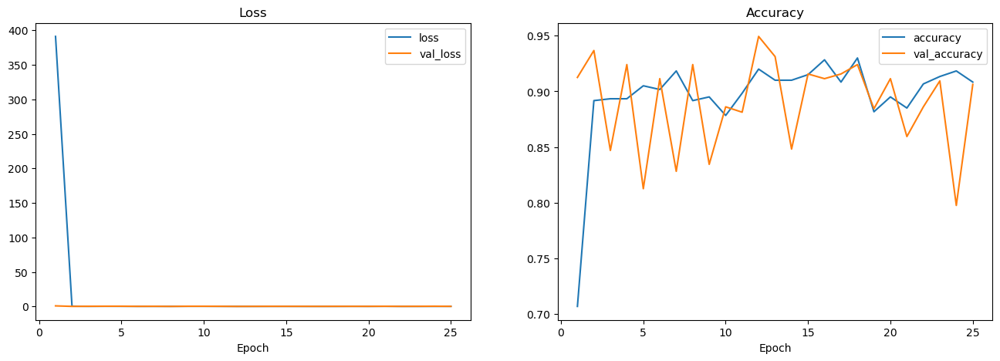

In [31]:
epoch=25

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history1.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history1.history['val_loss'],label='val_loss')
ax[0].set_title('Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')
#ax[0].set_ylim(0,0.01)

ax[1].plot(range(1,epoch+1),history1.history['accuracy'],label='accuracy')
ax[1].plot(range(1,epoch+1),history1.history['val_accuracy'],label='val_accuracy')
ax[1].set_title('Accuracy')
ax[1].legend()
ax[1].set_xlabel('Epoch')
#ax[1].set_ylim(0.5,1.5)

plt.show()

13/13 ━━━━━━━━━━━━━━━━━━━━ 13s 993ms/step
                 precision    recall  f1-score   support

    fire_images       0.77      0.75      0.76       302
non_fire_images       0.29      0.32      0.30        97

       accuracy                           0.64       399
      macro avg       0.53      0.53      0.53       399
   weighted avg       0.66      0.64      0.65       399



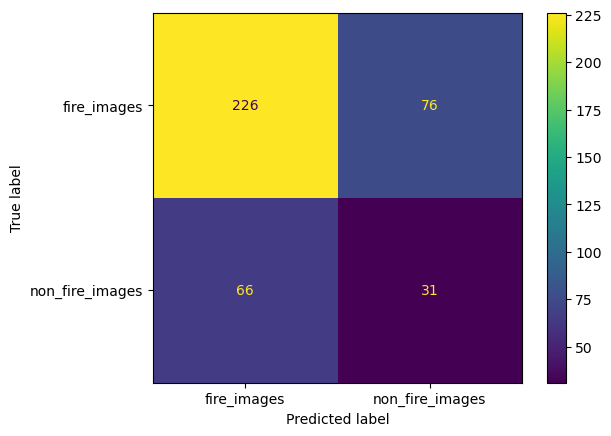

In [32]:
# Generate predictions on the validation data (val3)
y_pred = model1.predict(val3)

# The true labels from the validation set
y_true = val3.classes

# Convert the predicted probabilities to binary outcomes
y_pred_binary = (y_pred > 0.5).astype(int).flatten()

# Generate the classification report
print(classification_report(y_true, y_pred_binary, target_names=val3.class_indices.keys()))

# Display the confusion matrix
ConfusionMatrixDisplay.from_predictions(y_true, y_pred_binary, display_labels=val3.class_indices.keys())
plt.show()

In [33]:
test_results = model1.evaluate(val3, verbose=0)
print(f'Test Loss     : {test_results[0]:.4f}')
print(f'Test Accuracy : {test_results[1]:.4f}')

Test Loss     : 0.2417
Test Accuracy : 0.9123


Using the Flattening method shows our accuracy value to 91% and leads to overfitting.

# ANN Improvement

## Model Definition

In [24]:
model = tf.keras.models.Sequential()

model.add(tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(400, 400, 3)))
model.add(tf.keras.layers.MaxPooling2D(2, 2))
model.add(tf.keras.layers.Conv2D(64, (3,3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D(2, 2))
model.add(tf.keras.layers.Conv2D(128, (3,3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D(2, 2))
model.add(tf.keras.layers.GlobalAveragePooling2D())
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Dense(512, activation='relu'))
model.add(tf.keras.layers.Dense(1, activation='sigmoid'))  # Output layer for binary classification

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Display the model summary
model.summary()


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 398, 398, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 199, 199, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 197, 197, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 98, 98, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 96, 96, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 48, 48, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 159,809 (624.25 KB)

 Trainable params: 159,809 (624.25 KB)

 Non-trainable params: 0 (0.00 B)

Here we changed the method from Flatten to GlobalPoolingAverage to test if it would improve our model. Theoretically it should reduce overfitting and give better generalization.

## Model Training

In [25]:
# Train the ANN Model
history = model.fit(train3, epochs=25, steps_per_epoch=20, validation_data = val3, verbose = 1, validation_steps=10)

Epoch 1/25


/opt/anaconda3/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.6643 - loss: 1.8666

2024-08-12 16:55:51.948136: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/opt/anaconda3/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


20/20 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.6682 - loss: 1.8238 - val_accuracy: 0.8531 - val_loss: 0.3665
Epoch 2/25
19/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.8775 - loss: 0.3476

2024-08-12 16:56:46.793659: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


20/20 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.8761 - loss: 0.3481 - val_accuracy: 0.8608 - val_loss: 0.3039
Epoch 3/25
19/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.8590 - loss: 0.2287

2024-08-12 16:57:28.159414: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


20/20 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step - accuracy: 0.8601 - loss: 0.2289 - val_accuracy: 0.9094 - val_loss: 0.2667
Epoch 4/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9158 - loss: 0.2081 - val_accuracy: 0.9620 - val_loss: 0.1836
Epoch 5/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9409 - loss: 0.1450 - val_accuracy: 0.9406 - val_loss: 0.2913
Epoch 6/25
19/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9137 - loss: 0.2062

2024-08-12 16:59:50.344575: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


20/20 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9143 - loss: 0.2050 - val_accuracy: 0.8987 - val_loss: 0.2074
Epoch 7/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9274 - loss: 0.1668 - val_accuracy: 0.9438 - val_loss: 0.1353
Epoch 8/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9619 - loss: 0.1497 - val_accuracy: 0.8987 - val_loss: 0.2727
Epoch 9/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step - accuracy: 0.9069 - loss: 0.2080 - val_accuracy: 0.9000 - val_loss: 0.2399
Epoch 10/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9147 - loss: 0.2245 - val_accuracy: 0.9620 - val_loss: 0.1844
Epoch 11/25
19/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9337 - loss: 0.1573

2024-08-12 17:03:34.781467: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


20/20 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9336 - loss: 0.1590 - val_accuracy: 0.9406 - val_loss: 0.1748
Epoch 12/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9258 - loss: 0.1953 - val_accuracy: 0.9367 - val_loss: 0.1599
Epoch 13/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.9306 - loss: 0.1697 - val_accuracy: 0.9406 - val_loss: 0.1522
Epoch 14/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9129 - loss: 0.1741 - val_accuracy: 0.8987 - val_loss: 0.2134
Epoch 15/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.9468 - loss: 0.1420 - val_accuracy: 0.9031 - val_loss: 0.2106
Epoch 16/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.9111 - loss: 0.2058 - val_accuracy: 0.9620 - val_loss: 0.1638
Epoch 17/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.9367 - loss: 0.1475 - val_accuracy: 0.8938 - val_loss: 0.2474
Epoch 18/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9203 - loss: 0.2134 - val_accuracy: 0.8861 - val_loss: 0.2

2024-08-12 17:12:24.120010: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


20/20 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9285 - loss: 0.1959 - val_accuracy: 0.9620 - val_loss: 0.1533
Epoch 23/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.9289 - loss: 0.1645 - val_accuracy: 0.9312 - val_loss: 0.1492
Epoch 24/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9182 - loss: 0.2248 - val_accuracy: 0.9367 - val_loss: 0.1348
Epoch 25/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9423 - loss: 0.1292 - val_accuracy: 0.9438 - val_loss: 0.2332


## Model Evaluation

Text(0.5, 0, 'Epoch')

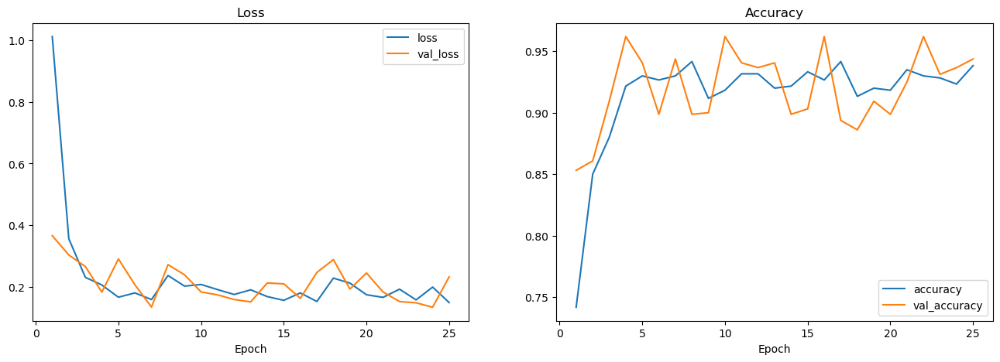

In [26]:
epoch=25

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history.history['val_loss'],label='val_loss')
ax[0].set_title('Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')
#ax[0].set_ylim(0,0.01)

ax[1].plot(range(1,epoch+1),history.history['accuracy'],label='accuracy')
ax[1].plot(range(1,epoch+1),history.history['val_accuracy'],label='val_accuracy')
ax[1].set_title('Accuracy')
ax[1].legend()
ax[1].set_xlabel('Epoch')
#ax[1].set_ylim(0.5,1.5)

13/13 ━━━━━━━━━━━━━━━━━━━━ 13s 996ms/step
                 precision    recall  f1-score   support

    fire_images       0.76      0.81      0.78       302
non_fire_images       0.24      0.19      0.21        97

       accuracy                           0.66       399
      macro avg       0.50      0.50      0.50       399
   weighted avg       0.63      0.66      0.65       399



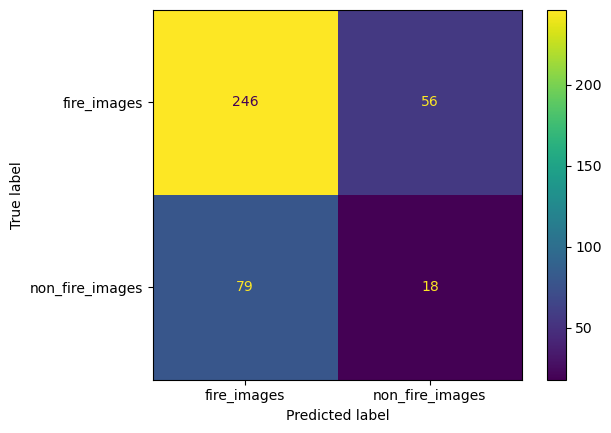

In [27]:
# Generate predictions on the validation data (val3)
y_pred = model.predict(val3)

# The true labels from the validation set
y_true = val3.classes

# Convert the predicted probabilities to binary outcomes
y_pred_binary = (y_pred > 0.5).astype(int).flatten()

# Generate the classification report
print(classification_report(y_true, y_pred_binary, target_names=val3.class_indices.keys()))

# Display the confusion matrix
ConfusionMatrixDisplay.from_predictions(y_true, y_pred_binary, display_labels=val3.class_indices.keys())
plt.show()


In [28]:
test_results = model.evaluate(val3, verbose=0)
print(f'Test Loss     : {test_results[0]:.4f}')
print(f'Test Accuracy : {test_results[1]:.4f}')

Test Loss     : 0.1961
Test Accuracy : 0.9323


The performance of this model increases the accuracy value to 93% and gives further stability, therefore this is the better model.

# Model Saving

In [48]:
tf.keras.models.save_model(model,'best_model.hdf5')

# Testing

In [38]:
from shutil import copyfile

# Directory containing the image files
source_directory = 'fire_dataset/'

# Destination directory for copied images
destination_directory = 'destination_directory/'

# Ensure the destination directory exists
os.makedirs(destination_directory, exist_ok=True)

# Get list of all image files in the source directory
files = [
    os.path.join(source_directory, 'fire_images/fire.18.png'),
    os.path.join(source_directory, 'non_fire_images/non_fire.16.png'),
    os.path.join(source_directory, 'fire_images/fire.100.png'),
    os.path.join(source_directory, 'non_fire_images/non_fire.47.png')
]

# Copy files to the destination directory and rename
for index, file_path in enumerate(files):
    if os.path.isfile(file_path):
        filename = 'img-test-' + str(index + 1) + '.jpg'
        destination_path = os.path.join(destination_directory, filename)
        copyfile(file_path, destination_path)
        print(f'Copied {file_path} to {destination_path}')
    else:
        print(f'File not found: {file_path}')


Copied fire_dataset/fire_images/fire.18.png to destination_directory/img-test-1.jpg
Copied fire_dataset/non_fire_images/non_fire.16.png to destination_directory/img-test-2.jpg
Copied fire_dataset/fire_images/fire.100.png to destination_directory/img-test-3.jpg
Copied fire_dataset/non_fire_images/non_fire.47.png to destination_directory/img-test-4.jpg


### Testing Image on Global Pooling Method

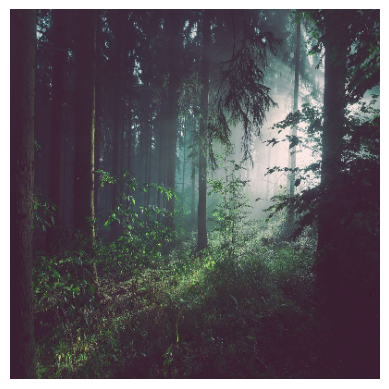

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
Predicted classes for img-test-4.jpg: [[0.34103468]]
fire


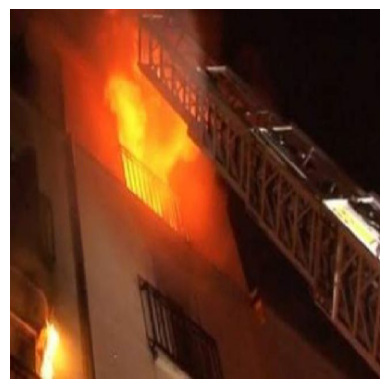

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Predicted classes for img-test-1.jpg: [[6.458109e-09]]
fire


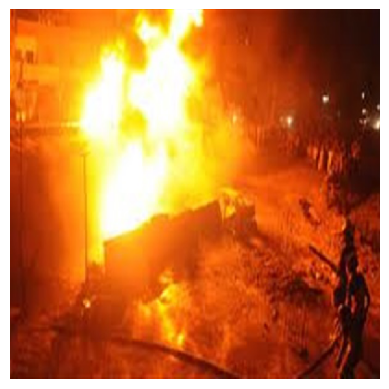

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted classes for img-test-3.jpg: [[4.8469152e-15]]
fire


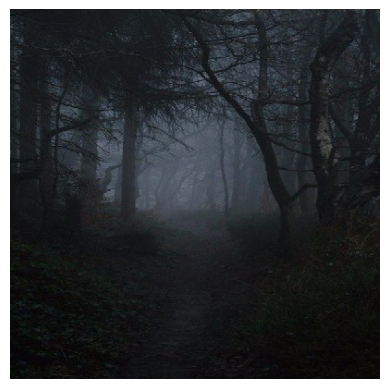

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Predicted classes for img-test-2.jpg: [[0.52058166]]
non-fire


In [39]:
# Define the path to your local directory containing images
image_directory = 'destination_directory'

# List all files in the directory
files = os.listdir(image_directory)

for fn in files:
    # Construct the full path to the image
    path = os.path.join(image_directory, fn)
    
    # Check if the path is a file (not a directory)
    if os.path.isfile(path):
        # Load and preprocess the image
        img = tf.keras.utils.load_img(path, target_size=(400, 400))
        plt.imshow(img)
        plt.axis('Off')
        plt.show()
        x = tf.keras.utils.img_to_array(img)
        x = np.expand_dims(x, axis=0)

        # Predict the class of the image
        classes = model.predict(x)
        print(f'Predicted classes for {fn}:', classes)
        
        # Apply threshold to determine the class
        if classes[0][0] >= 0.5:  # Assuming a threshold of 0.5 for binary classification
            print('non-fire')
        else:
            print('fire')

### Testing Image on Flatten Method

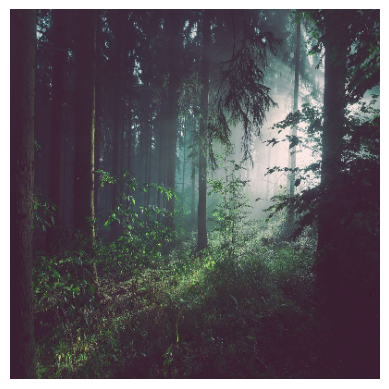

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step
Predicted classes for img-test-4.jpg: [[0.5120237]]
non-fire


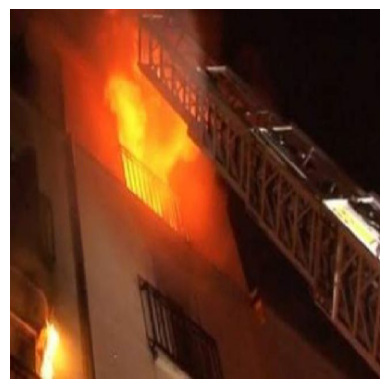

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Predicted classes for img-test-1.jpg: [[2.552202e-07]]
fire


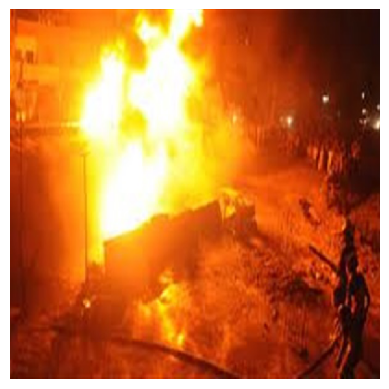

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Predicted classes for img-test-3.jpg: [[8.991189e-19]]
fire


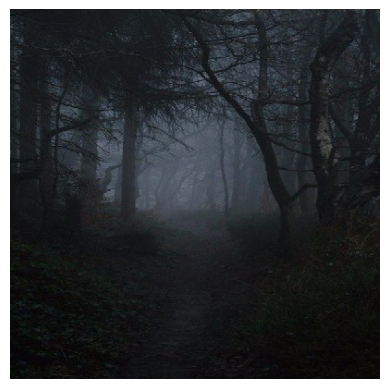

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Predicted classes for img-test-2.jpg: [[0.48590374]]
fire


In [40]:
for fn in files:
    # Construct the full path to the image
    path = os.path.join(image_directory, fn)
    
    # Check if the path is a file (not a directory)
    if os.path.isfile(path):
        # Load and preprocess the image
        img = tf.keras.utils.load_img(path, target_size=(400, 400))
        plt.imshow(img)
        plt.axis('Off')
        plt.show()
        x = tf.keras.utils.img_to_array(img)
        x = np.expand_dims(x, axis=0)

        # Predict the class of the image
        classes = model1.predict(x)
        print(f'Predicted classes for {fn}:', classes)
        
        # Apply threshold to determine the class
        if classes[0][0] >= 0.5:  # Assuming a threshold of 0.5 for binary classification
            print('non-fire')
        else:
            print('fire')

As you can see, using Flatten method leads to further inaccurate results.